In [67]:
import numpy as np
import pandas as pd
import scanpy
import gensim
from gensim import corpora
import seaborn as sns
import distinctipy
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

## Can we use topic modelling to find a better representation for cells? 

Its cool that it can be a way to capture degree of identity in classification tasks which can maybe provide something to work with on "generative annotation", i.e. use the parts reps to encourage different adjective usage as well as chain of thought

In [2]:
eso = scanpy.read_h5ad("../data/eso.h5ad")

In [3]:
id2word = dict(enumerate(eso.var_names))

In [4]:
corpus = gensim.matutils.Sparse2Corpus(eso.raw.X.T)

In [5]:
corpus[1]

[(16, 1.0),
 (18, 1.0),
 (36, 1.0),
 (46, 3.0),
 (56, 1.0),
 (64, 1.0),
 (86, 2.0),
 (122, 13.0),
 (130, 2.0),
 (143, 1.0),
 (148, 2.0),
 (152, 1.0),
 (153, 2.0),
 (157, 1.0),
 (160, 5.0),
 (174, 2.0),
 (181, 4.0),
 (209, 1.0),
 (213, 1.0),
 (284, 1.0),
 (303, 2.0),
 (305, 2.0),
 (308, 1.0),
 (323, 1.0),
 (329, 1.0),
 (343, 3.0),
 (361, 1.0),
 (365, 37.0),
 (368, 3.0),
 (381, 2.0),
 (382, 1.0),
 (385, 1.0),
 (395, 2.0),
 (421, 4.0),
 (428, 2.0),
 (433, 1.0),
 (434, 40.0),
 (445, 1.0),
 (448, 1.0),
 (450, 4.0),
 (468, 3.0),
 (477, 1.0),
 (495, 1.0),
 (498, 1.0),
 (504, 1.0),
 (513, 1.0),
 (515, 1.0),
 (525, 2.0),
 (528, 1.0),
 (539, 2.0),
 (544, 3.0),
 (556, 1.0),
 (557, 2.0),
 (569, 1.0),
 (579, 2.0),
 (594, 2.0),
 (598, 1.0),
 (624, 3.0),
 (676, 9.0),
 (684, 1.0),
 (708, 1.0),
 (710, 1.0),
 (722, 25.0),
 (739, 9.0),
 (740, 3.0),
 (751, 1.0),
 (754, 1.0),
 (755, 7.0),
 (803, 1.0),
 (804, 1.0),
 (820, 1.0),
 (835, 1.0),
 (840, 2.0),
 (853, 1.0),
 (871, 13.0),
 (873, 7.0),
 (884, 1.0),
 

In [6]:
hdp = gensim.models.HdpModel(corpus, id2word)

In [7]:
hdp.optimal_ordering()

In [47]:
hdp.print_topics(num_topics=5, num_words=10)

[(0,
  '0.029*ENSG00000171401 + 0.017*ENSG00000251562 + 0.012*ENSG00000163220 + 0.012*ENSG00000231500 + 0.012*ENSG00000137818 + 0.011*ENSG00000143546 + 0.011*ENSG00000196754 + 0.010*ENSG00000198804 + 0.009*ENSG00000164687 + 0.008*ENSG00000140988'),
 (1,
  '0.031*ENSG00000171401 + 0.031*ENSG00000163220 + 0.030*ENSG00000143546 + 0.021*ENSG00000251562 + 0.014*ENSG00000196754 + 0.013*ENSG00000160213 + 0.010*ENSG00000231500 + 0.010*ENSG00000121552 + 0.010*ENSG00000137818 + 0.010*ENSG00000198804'),
 (2,
  '0.021*ENSG00000251562 + 0.012*ENSG00000137818 + 0.012*ENSG00000231500 + 0.011*ENSG00000196754 + 0.009*ENSG00000198938 + 0.009*ENSG00000140988 + 0.009*ENSG00000142541 + 0.009*ENSG00000198804 + 0.009*ENSG00000137154 + 0.009*ENSG00000198712'),
 (3,
  '0.056*ENSG00000143546 + 0.051*ENSG00000163220 + 0.050*ENSG00000171401 + 0.033*ENSG00000160213 + 0.023*ENSG00000121552 + 0.021*ENSG00000251562 + 0.020*ENSG00000163209 + 0.014*ENSG00000170477 + 0.011*ENSG00000196754 + 0.010*ENSG00000198804'),
 (4,

In [9]:
pd.DataFrame(hdp.get_topics(), columns=eso.var_names).sum(axis=0).sort_values(ascending=False)

gene_ids
ENSG00000163220    0.490675
ENSG00000143546    0.485473
ENSG00000251562    0.462741
ENSG00000171401    0.431430
ENSG00000160213    0.387677
                     ...   
ENSG00000251152    0.004201
ENSG00000006837    0.004193
ENSG00000255666    0.004186
ENSG00000158516    0.004180
ENSG00000171243    0.004096
Length: 23906, dtype: float64

In [10]:
gene_map = scanpy.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id",'hgnc_symbol']
    ).set_index("ensembl_gene_id").to_dict()['hgnc_symbol']

In [11]:
eso.var_names.map(gene_map)

Index([        nan,         nan,    'WASH9P',         nan,         nan,
               nan,         nan,         nan,         nan, 'LINC01409',
       ...
               nan,     'MAFIP',         nan,         nan,         nan,
           'PRODH',         nan,         nan,         nan,         nan],
      dtype='object', name='gene_ids', length=23906)

<AxesSubplot: xlabel='gene_ids'>

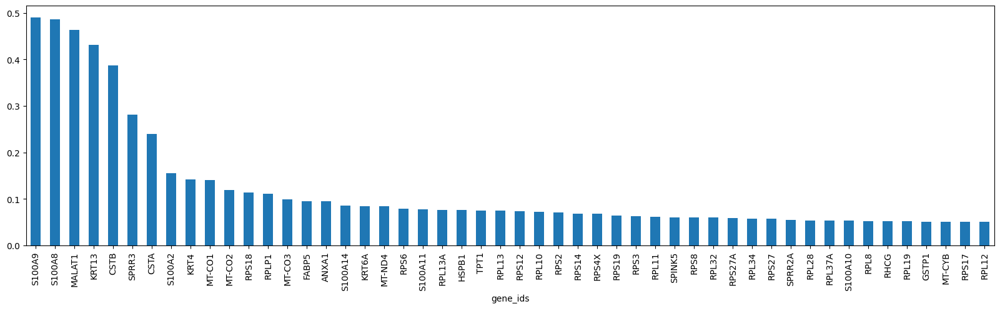

In [35]:
pd.DataFrame(hdp.get_topics(), columns=eso.var_names.map(gene_map)).sum(axis=0).sort_values(ascending=False)[:50].plot.bar(figsize=(20,5))

In [13]:
test = list(pd.DataFrame(hdp.get_topics(), columns=eso.var_names.map(gene_map)).sum(axis=0).sort_values(ascending=False)[:100].index)

In [14]:
print(*test, sep =', ')

S100A9, S100A8, MALAT1, KRT13, CSTB, SPRR3, CSTA, S100A2, KRT4, MT-CO1, MT-CO2, RPS18, RPLP1, MT-CO3, FABP5, ANXA1, S100A14, KRT6A, MT-ND4, RPS6, S100A11, RPL13A, HSPB1, TPT1, RPL13, RPS12, RPL10, RPS2, RPS14, RPS4X, RPS19, RPS3, RPL11, SPINK5, RPS8, RPL32, RPS27A, RPL34, RPS27, SPRR2A, RPL28, RPL37A, S100A10, RPL8, RHCG, RPL19, GSTP1, MT-CYB, RPS17, RPL12, RPL18A, RPL7A, SPRR2E, LY6D, RPLP2, MT-ND3, RPL3, CNFN, SFN, MT-ND2, GAPDH, TMSB4X, MT-ATP6, RPS16, RPL10A, RPS24, TMSB10, RPS15, RPL29, RPS23, RPL27A, ACTG1, RPS15A, TXN, S100A16, KRT5, PERP, RPS5, AQP3, RPL18, RPS9, RPS3A, FTH1, RPS13, CRNN, RPL35, RPL41, MT2A, NEAT1, ACTB, RPL37, S100A6, RPL21, RPL9, RPL36, EIF1, CRCT1, RPL35A, SPRR1B, CD24


In [15]:
for x in [x.split('*')[1] for x in hdp.print_topics(num_topics=1, num_words=10)[0][1].split(' + ')]:
    print(gene_map[x])

KRT13
MALAT1
S100A9
RPS18
RPLP1
S100A8
S100A2
MT-CO1
FABP5
RPS2


In [16]:
print(*[gene_map[k] for k in [x.split('*')[1] for x in hdp.print_topics(num_topics=10, num_words=10)[0][1].split(' + ')]], sep=', ')

KRT13, MALAT1, S100A9, RPS18, RPLP1, S100A8, S100A2, MT-CO1, FABP5, RPS2


In [21]:
for topic in range(0,10):
    print(*[gene_map[k] for k in [x.split('*')[1] for x in hdp.print_topics(num_topics=10, num_words=20)[topic][1].split(' + ')]], sep=', ')

KRT13, MALAT1, S100A9, RPS18, RPLP1, S100A8, S100A2, MT-CO1, FABP5, RPS2, MT-CO2, RPL13A, RPS6, MT-CO3, RPS12, HSPB1, RPL13, KRT5, RPL10, RPS14
KRT13, S100A9, S100A8, MALAT1, S100A2, CSTB, RPS18, CSTA, RPLP1, MT-CO1, FABP5, MT-CO2, KRT6A, MT-CO3, RPS12, HSPB1, RPS2, RPL13A, RPS6, S100A11
MALAT1, RPLP1, RPS18, S100A2, MT-CO3, RPS2, RPL13A, MT-CO1, RPS6, MT-CO2, RPL13, RPS12, RPL10, RPS3, RPS4X, RPS19, RPS14, KRT13, RPL32, KRT14
S100A8, S100A9, KRT13, CSTB, CSTA, MALAT1, SPRR3, KRT4, S100A2, MT-CO1, KRT6A, HSPB1, S100A11, RPLP1, RPS18, ANXA1, MT-CO2, FABP5, S100A14, MT-CO3
S100A9, SPRR3, S100A8, CSTB, MALAT1, KRT13, CSTA, CNFN, CRCT1, FTH1, ANXA1, CRNN, S100A14, SPINK5, SPRR2A, KRT4, MAL, SPRR1B, RHCG, S100A11
S100A8, S100A9, CSTB, KRT13, SPRR3, CSTA, MALAT1, KRT4, ANXA1, KRT6A, S100A14, S100A11, MT-CO1, HSPB1, RHCG, SLURP1, S100A2, MT-CO2, CRNN, SPINK5
MALAT1, TMSB4X, B2M, RPL10, RPLP1, RPS18, RPL13, RPL13A, RPS27, MT-CO1, RPS6, RPL34, RPS12, RPL32, RPS19, RPS14, RPS2, RPS27A, TPT1, RPL

In [23]:
hdp.get_topics().shape

(150, 23906)

In [110]:
#np.where(eso.obs['cell_type'] == "B cell")

(array([ 3704,  3827,  6225,  9113, 11168, 24047, 27238, 27320, 27649,
        27921, 30441, 30487, 30512, 31209, 32452, 32536, 33332, 34929,
        34958, 35532, 35925, 35935, 36248, 36361, 36709, 36751, 36851,
        36885, 37097, 37132, 37226, 37490, 37578, 38168, 38566, 38631,
        38675, 38958, 39178, 39480, 39756, 39820, 39934, 39998, 40154,
        40199, 40272, 40347, 40399, 40403, 40543, 40598, 40677, 40749,
        40802, 40852, 40900, 41061, 41094, 41250, 41282, 41296, 41303,
        41318, 41342, 41383, 41737, 41998, 42412, 42498, 42510, 42550,
        42786, 42828, 42840, 42858, 42982, 43116, 43143, 43310, 43568,
        43587, 43834, 44018, 44093, 46928, 50243, 51309, 51446, 53589,
        53814, 53833, 54107, 54728, 54731, 54966, 55071, 55084, 55259,
        55388, 55460, 55583, 55688, 55754, 55757, 55769, 55832, 55872,
        56360, 56373, 56423, 56645, 56717, 57037, 57329, 57477, 57606,
        57613, 57728, 57781, 57808, 58512, 58623, 58829, 58884, 58892,
      

In [97]:
eso.obs['cell_type'][4]

'CD4-positive, alpha-beta T cell'

In [116]:
corpus[4]

[(82, 1.0),
 (160, 1.0),
 (305, 1.0),
 (365, 7.0),
 (383, 2.0),
 (467, 2.0),
 (568, 1.0),
 (630, 1.0),
 (638, 1.0),
 (722, 2.0),
 (775, 1.0),
 (911, 1.0),
 (933, 1.0),
 (1004, 1.0),
 (1144, 1.0),
 (1146, 1.0),
 (1188, 1.0),
 (1214, 1.0),
 (1247, 1.0),
 (1367, 1.0),
 (1391, 2.0),
 (1394, 1.0),
 (1447, 1.0),
 (1488, 3.0),
 (1490, 1.0),
 (1496, 2.0),
 (1506, 1.0),
 (1513, 1.0),
 (1520, 6.0),
 (1522, 1.0),
 (1574, 1.0),
 (1626, 1.0),
 (1700, 1.0),
 (1880, 1.0),
 (1910, 1.0),
 (1923, 1.0),
 (2115, 1.0),
 (2518, 1.0),
 (2559, 1.0),
 (2693, 1.0),
 (2730, 1.0),
 (2761, 1.0),
 (2764, 4.0),
 (2866, 1.0),
 (2872, 2.0),
 (2970, 5.0),
 (2994, 1.0),
 (3108, 1.0),
 (3119, 1.0),
 (3236, 1.0),
 (3340, 1.0),
 (3643, 1.0),
 (3691, 1.0),
 (3744, 2.0),
 (3760, 1.0),
 (3964, 1.0),
 (3975, 1.0),
 (4025, 1.0),
 (4074, 2.0),
 (4083, 1.0),
 (4214, 2.0),
 (4220, 2.0),
 (4317, 1.0),
 (4368, 1.0),
 (4390, 1.0),
 (4451, 1.0),
 (4453, 1.0),
 (4622, 1.0),
 (4651, 1.0),
 (4656, 1.0),
 (4722, 1.0),
 (4725, 1.0),
 (4743

In [117]:
hdp[corpus[4]]

[(3, 0.8614232451100899), (26, 0.13351242449267975)]

In [101]:
print(*[gene_map[k] for k in [x.split('*')[1] for x in hdp.print_topics(num_topics=26, num_words=10)[25][1].split(' + ')]], sep=', ')

KRT13, FABP5, S100A2, RPS27A, RPS12, RPS8, TPT1, LY6D, MT2A, RPL37A


In [24]:
preds = [hdp[i] for i in corpus]

In [25]:
flattened_data = [(sublist_index, index, value) for sublist_index, sublist in enumerate(preds) for index, value in sublist]
df = pd.DataFrame(flattened_data, columns=['sublist_index', 'index', 'value'])

# Pivot the DataFrame to have index as columns
df = df.pivot(index='sublist_index', columns='index', values='value').fillna(0).reset_index(drop=True)

df

index,0,1,2,3,4,5,6,7,8,9,...,122,128,130,131,134,136,138,139,146,147
0,0.000000,0.069635,0.000000,0.492669,0.000000,0.296930,0.000000,0.100260,0.033795,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.435393,0.321497,0.000000,0.178307,0.000000,0.000000,0.000000,0.057375,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.646842,0.074206,0.136579,0.000000,0.000000,0.000000,0.000000,0.141116,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.036145,0.000000,0.417388,0.000000,0.406066,0.000000,0.055558,0.078515,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.998210,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87942,0.000000,0.000000,0.000000,0.000000,0.999920,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
87943,0.057835,0.000000,0.883702,0.000000,0.010913,0.000000,0.035074,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
87944,0.838396,0.011271,0.147247,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
87945,0.000000,0.000000,0.599228,0.000000,0.000000,0.000000,0.400495,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [110]:
for topic in range(0,10):
    eso.obs[f"topic_{topic}"] = df[topic]

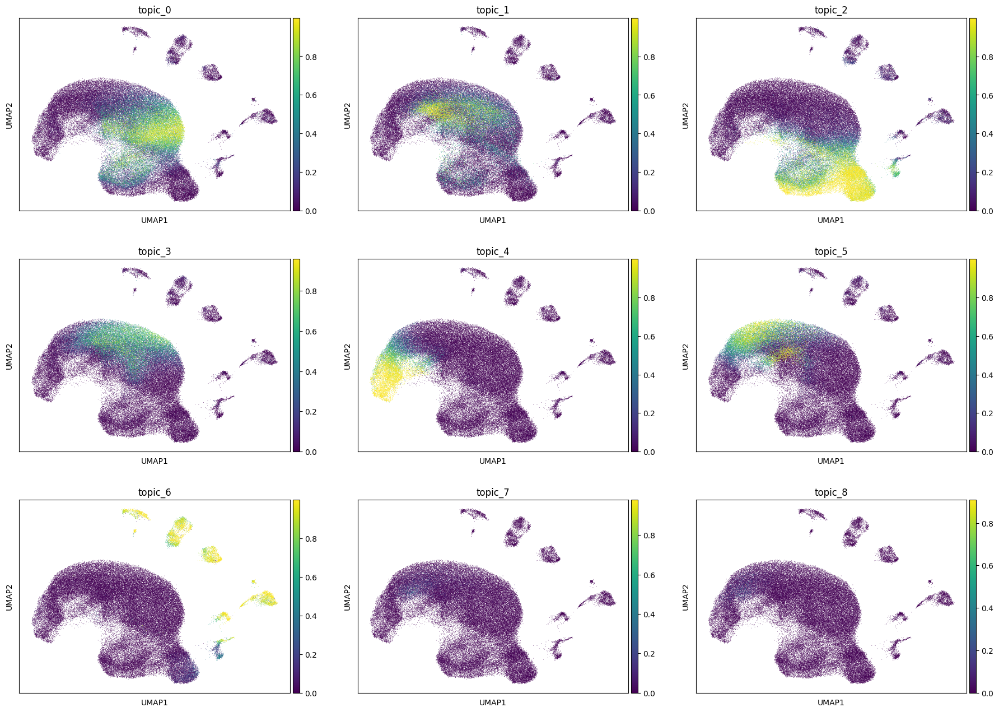

In [111]:
scanpy.pl.umap(eso, color=['topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8',], ncols=3)

In [372]:
"""from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

similarity_matrix = pdist(df.values, metric='cosine')

# Perform hierarchical clustering
Z = linkage(similarity_matrix, method='ward')

# Plot the dendrogram to visualize the clustering
plt.figure(figsize=(10, 6))
dendrogram(Z, labels=df.index, orientation='top')
plt.title('Dendrogram')
plt.xlabel('Rows')
plt.ylabel('Distance')
plt.show()"""

"from scipy.spatial.distance import pdist\nfrom scipy.cluster.hierarchy import linkage, dendrogram\nimport matplotlib.pyplot as plt\n\nsimilarity_matrix = pdist(df.values, metric='cosine')\n\n# Perform hierarchical clustering\nZ = linkage(similarity_matrix, method='ward')\n\n# Plot the dendrogram to visualize the clustering\nplt.figure(figsize=(10, 6))\ndendrogram(Z, labels=df.index, orientation='top')\nplt.title('Dendrogram')\nplt.xlabel('Rows')\nplt.ylabel('Distance')\nplt.show()"

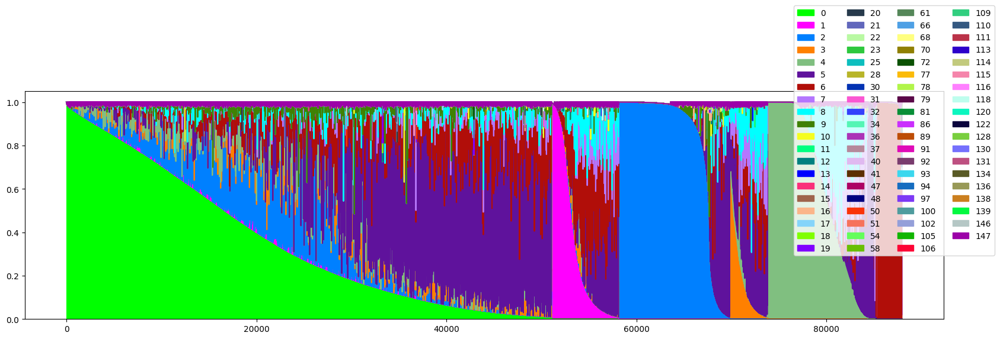

In [34]:
df.sort_values(by=list(df.columns), ascending=False).reset_index(drop=True).plot(kind='area',  figsize=(20,5), color=distinctipy.get_colors(79))
plt.legend(bbox_to_anchor=(1.06, 0.26), loc='lower right', ncols=4,)

In [27]:
df.index = eso.obs_names

In [376]:
#df['cell_type'] = eso.obs['cell_type']

In [28]:
df

index,0,1,2,3,4,5,6,7,8,9,...,122,128,130,131,134,136,138,139,146,147
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAAGGTTT-1-HCATisStab7413619,0.000000,0.069635,0.000000,0.492669,0.000000,0.296930,0.000000,0.100260,0.033795,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGAGTCTGG-1-HCATisStab7413619,0.435393,0.321497,0.000000,0.178307,0.000000,0.000000,0.000000,0.057375,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGAGCCCAATT-1-HCATisStab7413619,0.646842,0.074206,0.136579,0.000000,0.000000,0.000000,0.000000,0.141116,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGCATGCCCGA-1-HCATisStab7413619,0.000000,0.036145,0.000000,0.417388,0.000000,0.406066,0.000000,0.055558,0.078515,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCTGTCGAACGGA-1-HCATisStab7413619,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.998210,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACATTGGCGC-1-HCATisStabAug177376568,0.000000,0.000000,0.000000,0.000000,0.999920,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAGTACCGTTA-1-HCATisStabAug177376568,0.057835,0.000000,0.883702,0.000000,0.010913,0.000000,0.035074,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTCAGTCTGCCAG-1-HCATisStabAug177376568,0.838396,0.011271,0.147247,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [378]:
"""df.groupby(eso.obs['cell_type'][:10000]).apply(lambda x: x.sort_values(list(x.columns), ascending=False)).plot(kind='area', figsize=(30,5), color=distinctipy.get_colors(27), alpha=0.5)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(rotation=90)"""

"df.groupby(eso.obs['cell_type'][:10000]).apply(lambda x: x.sort_values(list(x.columns), ascending=False)).plot(kind='area', figsize=(30,5), color=distinctipy.get_colors(27), alpha=0.5)\nplt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)\nplt.xticks(rotation=90)"

In [379]:
#df.groupby(eso.obs['cell_type'][:10000]).apply(lambda x: x.sort_values(list(x.columns), ascending=False)).droplevel(1).groupby('cell_type').plot(kind='area', figsize=(30,5), color=distinctipy.get_colors(27), alpha=0.5)

Text(0.5, 1.0, 'Epithelial Cell Topics')

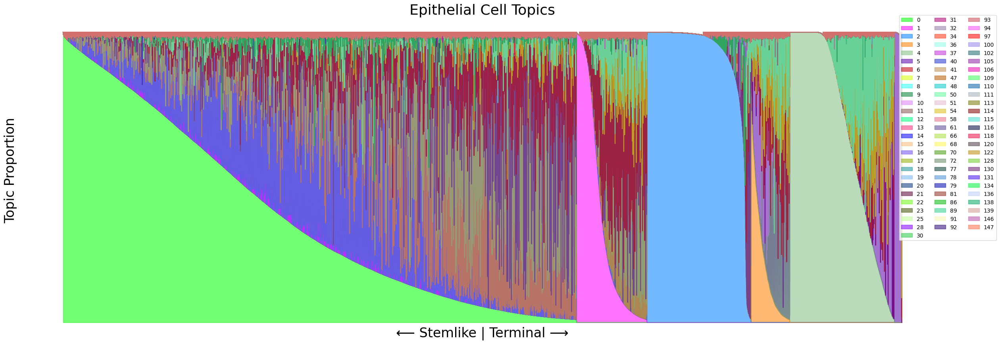

In [33]:
df[eso.obs['cell_type'].isin(['epithelial cell', 'stratified epithelial cell', 'epithelial cell of stratum germinativum of esophagus'])].sort_values(list(df.columns), ascending=False).plot(kind='area', figsize=(30,10), color=distinctipy.get_colors(79), alpha=0.55)
plt.legend(bbox_to_anchor=(1.06, 0.26), loc='lower right', ncols=3,)
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.xlabel('⟵ Stemlike | Terminal ⟶', size=24)
plt.ylabel('Topic Proportion', size=24)
plt.title('Epithelial Cell Topics', size=26)

In [381]:
import umap

In [382]:
topic_umap = umap.UMAP(n_neighbors=100, min_dist=0.8).fit_transform(df)

In [383]:
topic_umap = pd.DataFrame(topic_umap, columns=['UMAP1', 'UMAP2'])

In [384]:
topic_umap.index = eso.obs_names

In [385]:
topic_umap['cell_type'] = eso.obs['cell_type']

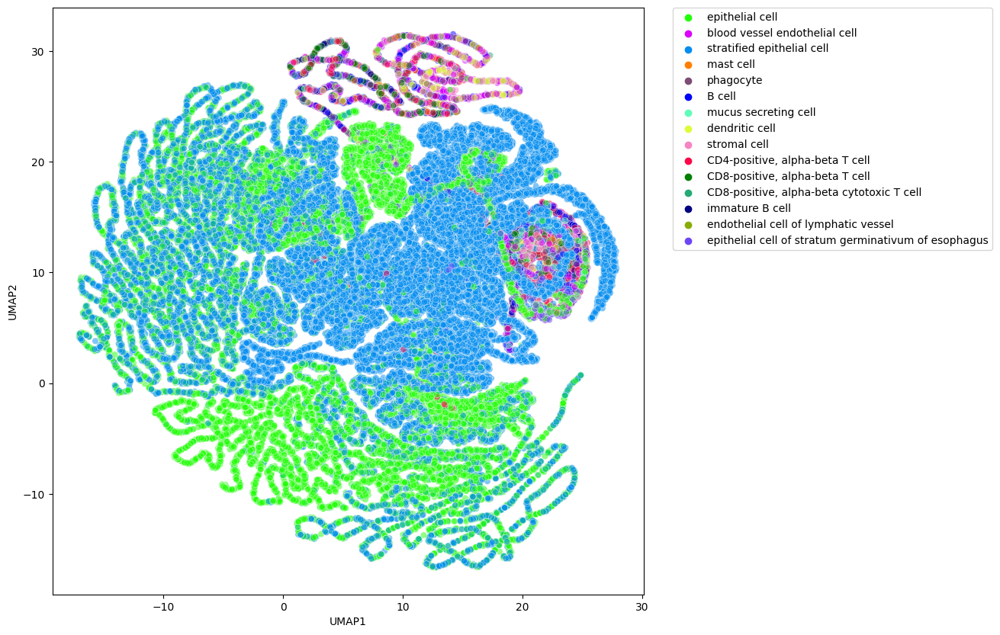

In [386]:
plt.figure(figsize=(10,10))
sns.scatterplot(data=topic_umap, x='UMAP1', y='UMAP2', hue='cell_type', palette=distinctipy.get_colors(15), alpha=0.5)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [387]:
topic_umap3d = umap.UMAP(n_components=3 , n_neighbors=100, min_dist=0.8).fit_transform(df)

In [388]:
topic_umap3d = pd.DataFrame(topic_umap3d, columns=['UMAP1', 'UMAP2', 'UMAP3'])

In [389]:
topic_umap3d.index = eso.obs_names
topic_umap3d['cell_type'] = eso.obs['cell_type']

In [390]:
import plotly.express as px

In [391]:
topic_umap3d['cell_type'] = topic_umap3d['cell_type'].astype(str)

In [398]:
[distinctipy.get_hex(x) for x in distinctipy.get_colors(15)]

['#00ff00',
 '#ff00ff',
 '#0080ff',
 '#ff8000',
 '#80bf80',
 '#700c8e',
 '#008732',
 '#0bfee5',
 '#f578ba',
 '#c90306',
 '#ffff00',
 '#0000ff',
 '#846608',
 '#7d4dfe',
 '#85ed09']

In [405]:
px.scatter_3d(topic_umap3d, x="UMAP1", y="UMAP2", z="UMAP3", color="cell_type", opacity=0.8, template='simple_white', color_discrete_sequence=[distinctipy.get_hex(x) for x in distinctipy.get_colors(15)] )#.write_html("umap3d88k.html")